In [0]:
%matplotlib inline

# download and install pytorch
!pip3 install https://download.pytorch.org/whl/cu92/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
!pip3 install torchvision

# install pillow
!pip uninstall -y Pillow
!pip install Pillow==4.1.1

# download and unzip dataset o train
!wget http://images.cocodataset.org/zips/train2014.zip
!mkdir train
%cd /content/train
!unzip -qq /content/train2014.zip
%cd ..

#download model
!wget https://s3-us-west-2.amazonaws.com/jcjohns-models/vgg16-00b39a1b.pth
  
# download helper code
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/transformer.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/utils.py
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/vgg.py

# download style image  
!wget https://raw.githubusercontent.com/iamRusty/fast-neural-style-pytorch/master/images/mosaic.jpg

    100% |████████████████████████████████| 512.6MB 32kB/s 
tcmalloc: large alloc 1073750016 bytes == 0x58590000 @  0x7fd83f0b42a4 0x591a07 0x5b5d56 0x502e9a 0x506859 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x502209 0x502f3d 0x506859 0x504c28 0x502540 0x502f3d 0x507641 0x504c28 0x502540 0x502f3d 0x507641
    100% |████████████████████████████████| 61kB 2.3MB/s 
    100% |████████████████████████████████| 2.0MB 11.8MB/s 
  Found existing installation: Pillow 4.0.0
    Uninstalling Pillow-4.0.0:
      Successfully uninstalled Pillow-4.0.0
  [PIL]
You must restart the runtime in order to use newly installed versions.
Uninstalling Pillow-5.4.1:
  Successfully uninstalled Pillow-5.4.1
    100% |████████████████████████████████| 5.7MB 7.9MB/s 
  [PIL]
You must restart the runtime in order to use newly installed versions.
--2019-01-21 11:20:16--  http://images.cocodataset.org/zips/train2014.zip
Reso

In [0]:
import PIL
from PIL import Image
import matplotlib.pyplot as plt
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import random
import numpy as np
import time
import vgg
import transformer
import utils

In [0]:
# GLOBAL SETTINGS
TRAIN_IMAGE_SIZE = 256
DATASET_PATH = "/content/train"
NUM_EPOCHS = 1
STYLE_IMAGE_PATH = "/content/mosaic.jpg"
BATCH_SIZE = 4 
CONTENT_WEIGHT = 2e-6
STYLE_WEIGHT = 50
TV_WEIGHT = 1e-6 
ADAM_LR = 0.001
SAVE_MODEL_PATH = "/content/"
SAVE_IMAGE_PATH = "/content/"
SAVE_MODEL_EVERY = 500 # 2,000 Images with batch size 4
SEED = 35

========Epoch 1/2========
========Iteration 1/20696========
	Content Loss:	3578516.75
	Style Loss:	201332160.00
	Total Loss:	204910672.00
Time elapsed:	0.9158451557159424 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_0.pth


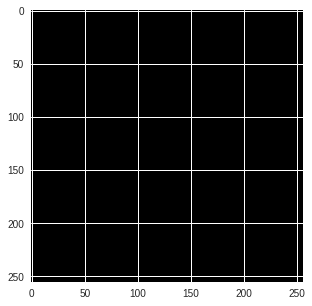

Saved sample tranformed image at /content/sample0_0.png
========Iteration 501/20696========
	Content Loss:	8133666.00
	Style Loss:	54674496.00
	Total Loss:	62808172.33
Time elapsed:	336.62528228759766 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_500.pth


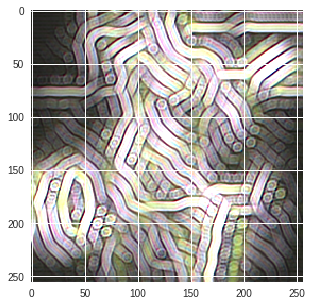

Saved sample tranformed image at /content/sample0_500.png
========Iteration 1001/20696========
	Content Loss:	8797500.00
	Style Loss:	30859382.00
	Total Loss:	39656895.21
Time elapsed:	673.6658208370209 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1000.pth


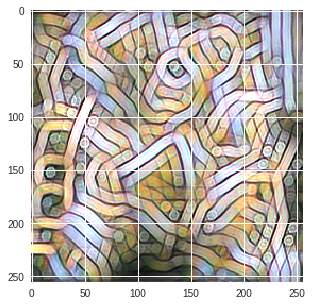

Saved sample tranformed image at /content/sample0_1000.png
========Iteration 1501/20696========
	Content Loss:	8864147.00
	Style Loss:	22092978.00
	Total Loss:	30957147.79
Time elapsed:	1010.2264273166656 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_1500.pth


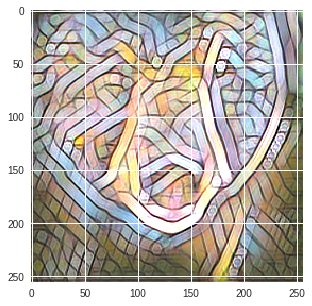

Saved sample tranformed image at /content/sample0_1500.png
========Iteration 2001/20696========
	Content Loss:	8758375.00
	Style Loss:	17444306.00
	Total Loss:	26202698.50
Time elapsed:	1346.3148522377014 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2000.pth


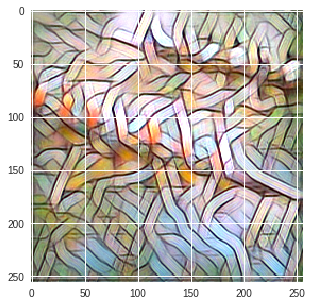

Saved sample tranformed image at /content/sample0_2000.png
========Iteration 2501/20696========
	Content Loss:	8592626.00
	Style Loss:	14507934.00
	Total Loss:	23100589.57
Time elapsed:	1682.1684391498566 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_2500.pth


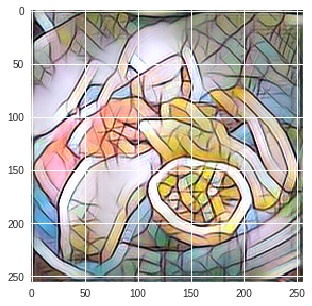

Saved sample tranformed image at /content/sample0_2500.png
========Iteration 3001/20696========
	Content Loss:	8407234.00
	Style Loss:	12474051.00
	Total Loss:	20881313.87
Time elapsed:	2018.078851222992 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3000.pth


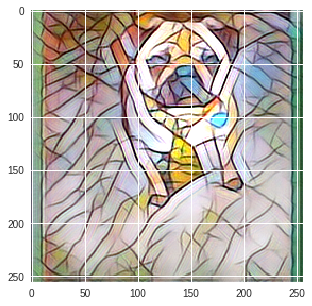

Saved sample tranformed image at /content/sample0_3000.png
========Iteration 3501/20696========
	Content Loss:	8232740.50
	Style Loss:	10994677.00
	Total Loss:	19227443.96
Time elapsed:	2353.924836874008 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_3500.pth


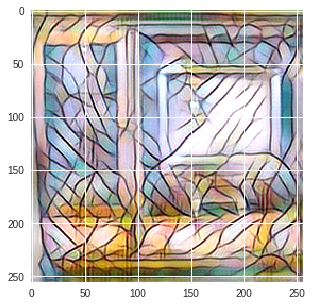

Saved sample tranformed image at /content/sample0_3500.png
========Iteration 4001/20696========
	Content Loss:	8103754.50
	Style Loss:	9881491.00
	Total Loss:	17985275.25
Time elapsed:	2689.8542346954346 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4000.pth


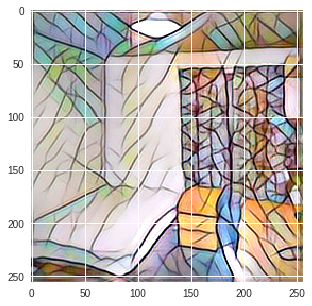

Saved sample tranformed image at /content/sample0_4000.png
========Iteration 4501/20696========
	Content Loss:	7975627.50
	Style Loss:	8989234.00
	Total Loss:	16964878.24
Time elapsed:	3025.810302257538 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_4500.pth


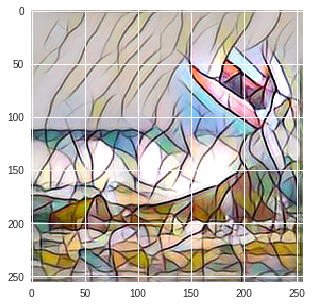

Saved sample tranformed image at /content/sample0_4500.png
========Iteration 5001/20696========
	Content Loss:	7860179.00
	Style Loss:	8269410.50
	Total Loss:	16129607.72
Time elapsed:	3363.5443398952484 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5000.pth


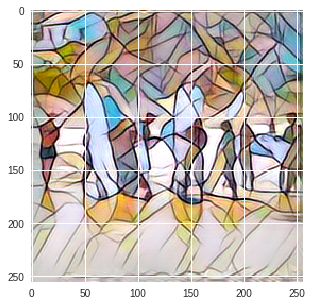

Saved sample tranformed image at /content/sample0_5000.png
========Iteration 5501/20696========
	Content Loss:	7758641.50
	Style Loss:	7676232.50
	Total Loss:	15434892.48
Time elapsed:	3701.1777160167694 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_5500.pth


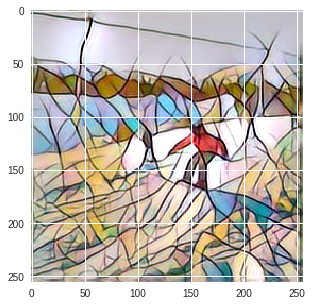

Saved sample tranformed image at /content/sample0_5500.png
========Iteration 6001/20696========
	Content Loss:	7667170.50
	Style Loss:	7177128.00
	Total Loss:	14844307.99
Time elapsed:	4038.7204496860504 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6000.pth


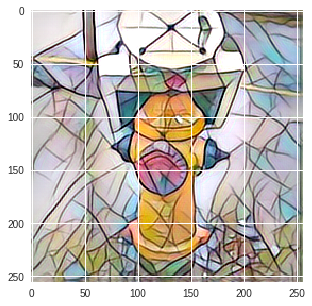

Saved sample tranformed image at /content/sample0_6000.png
========Iteration 6501/20696========
	Content Loss:	7584911.00
	Style Loss:	6751683.50
	Total Loss:	14336598.62
Time elapsed:	4375.907423019409 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_6500.pth


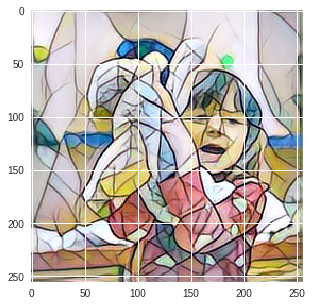

Saved sample tranformed image at /content/sample0_6500.png
========Iteration 7001/20696========
	Content Loss:	7509332.50
	Style Loss:	6384956.00
	Total Loss:	13894293.65
Time elapsed:	4712.132279634476 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7000.pth


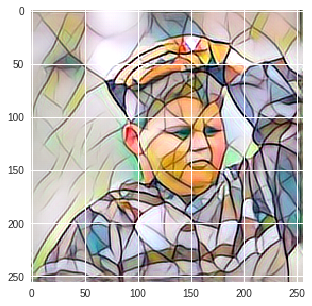

Saved sample tranformed image at /content/sample0_7000.png
========Iteration 7501/20696========
	Content Loss:	7440562.50
	Style Loss:	6067557.50
	Total Loss:	13508128.77
Time elapsed:	5048.46683049202 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_7500.pth


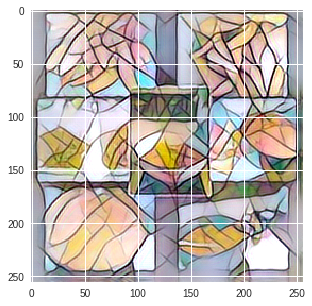

Saved sample tranformed image at /content/sample0_7500.png
========Iteration 8001/20696========
	Content Loss:	7380370.00
	Style Loss:	5786261.50
	Total Loss:	13166637.33
Time elapsed:	5384.767863988876 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8000.pth


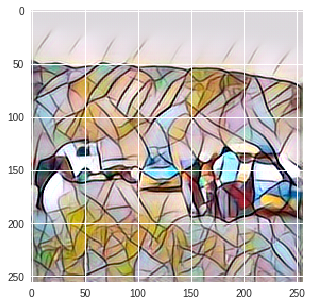

Saved sample tranformed image at /content/sample0_8000.png
========Iteration 8501/20696========
	Content Loss:	7325738.00
	Style Loss:	5537300.50
	Total Loss:	12863048.24
Time elapsed:	5721.128170251846 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_8500.pth


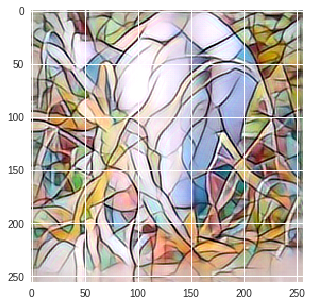

Saved sample tranformed image at /content/sample0_8500.png
========Iteration 9001/20696========
	Content Loss:	7275891.00
	Style Loss:	5315573.50
	Total Loss:	12591474.79
Time elapsed:	6057.424101114273 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9000.pth


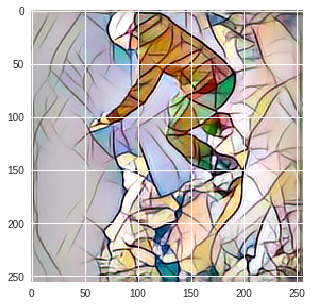

Saved sample tranformed image at /content/sample0_9000.png
========Iteration 9501/20696========
	Content Loss:	7231418.50
	Style Loss:	5116417.00
	Total Loss:	12347843.33
Time elapsed:	6393.795252323151 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_9500.pth


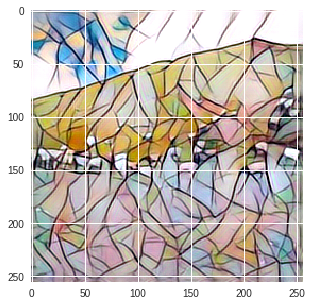

Saved sample tranformed image at /content/sample0_9500.png
========Iteration 10001/20696========
	Content Loss:	7190081.50
	Style Loss:	4934783.00
	Total Loss:	12124873.33
Time elapsed:	6730.183598279953 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10000.pth


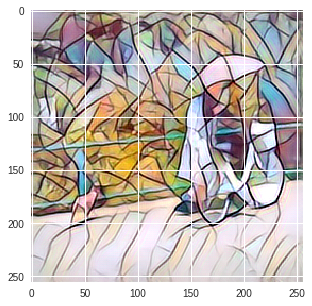

Saved sample tranformed image at /content/sample0_10000.png
========Iteration 10501/20696========
	Content Loss:	7151545.00
	Style Loss:	4770333.50
	Total Loss:	11921884.08
Time elapsed:	7066.453950643539 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_10500.pth


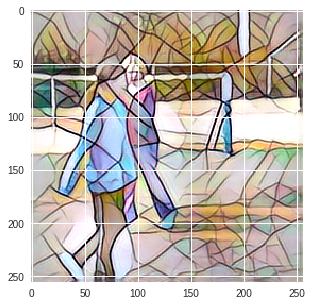

Saved sample tranformed image at /content/sample0_10500.png
========Iteration 11001/20696========
	Content Loss:	7115830.00
	Style Loss:	4619983.00
	Total Loss:	11735810.86
Time elapsed:	7402.680919408798 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11000.pth


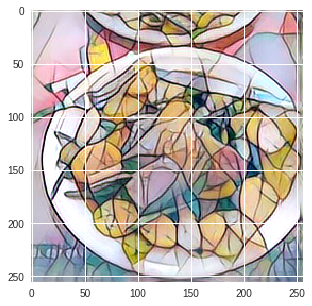

Saved sample tranformed image at /content/sample0_11000.png
========Iteration 11501/20696========
	Content Loss:	7082353.00
	Style Loss:	4481765.50
	Total Loss:	11564116.23
Time elapsed:	7738.756551265717 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_11500.pth


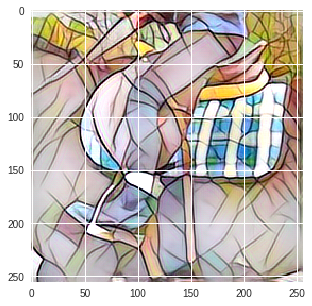

Saved sample tranformed image at /content/sample0_11500.png
========Iteration 12001/20696========
	Content Loss:	7049086.00
	Style Loss:	4354812.00
	Total Loss:	11403896.40
Time elapsed:	8075.30273604393 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12000.pth


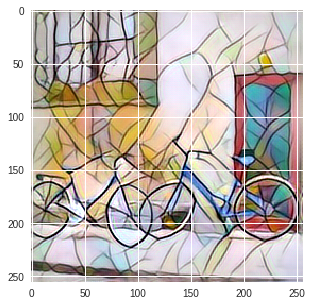

Saved sample tranformed image at /content/sample0_12000.png
========Iteration 12501/20696========
	Content Loss:	7019782.50
	Style Loss:	4238084.00
	Total Loss:	11257863.77
Time elapsed:	8411.553355693817 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_12500.pth


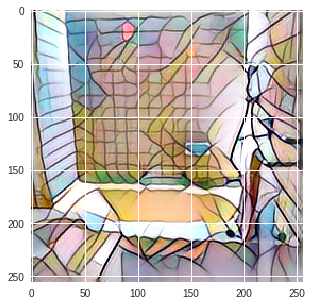

Saved sample tranformed image at /content/sample0_12500.png
========Iteration 13001/20696========
	Content Loss:	6993420.50
	Style Loss:	4129301.75
	Total Loss:	11122719.40
Time elapsed:	8747.7867872715 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13000.pth


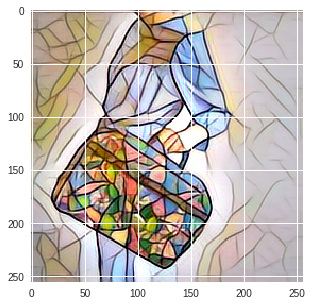

Saved sample tranformed image at /content/sample0_13000.png
========Iteration 13501/20696========
	Content Loss:	6968185.00
	Style Loss:	4028433.00
	Total Loss:	10996610.84
Time elapsed:	9084.01675581932 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_13500.pth


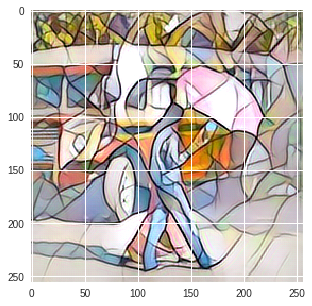

Saved sample tranformed image at /content/sample0_13500.png
========Iteration 14001/20696========
	Content Loss:	6944670.00
	Style Loss:	3934427.50
	Total Loss:	10879090.87
Time elapsed:	9420.420056343079 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14000.pth


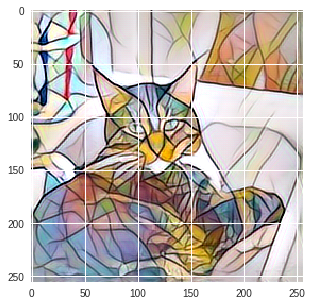

Saved sample tranformed image at /content/sample0_14000.png
========Iteration 14501/20696========
	Content Loss:	6919993.50
	Style Loss:	3846680.50
	Total Loss:	10766664.50
Time elapsed:	9756.642688512802 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_14500.pth


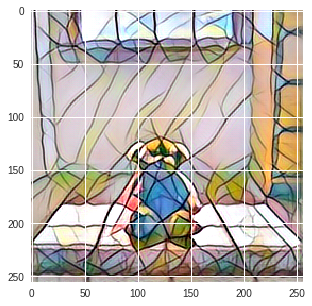

Saved sample tranformed image at /content/sample0_14500.png
========Iteration 15001/20696========
	Content Loss:	6897697.00
	Style Loss:	3764030.25
	Total Loss:	10661724.15
Time elapsed:	10092.878559827805 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15000.pth


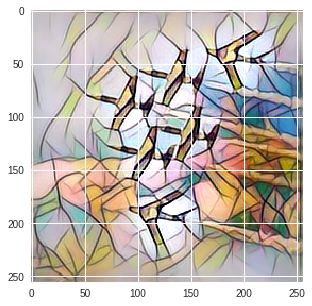

Saved sample tranformed image at /content/sample0_15000.png
========Iteration 15501/20696========
	Content Loss:	6876625.00
	Style Loss:	3686750.75
	Total Loss:	10563371.18
Time elapsed:	10429.112244844437 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_15500.pth


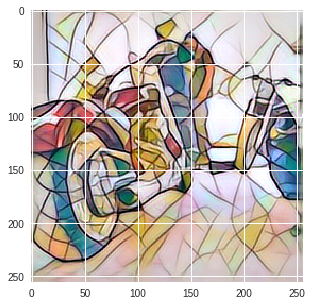

Saved sample tranformed image at /content/sample0_15500.png
========Iteration 16001/20696========
	Content Loss:	6856622.00
	Style Loss:	3614432.25
	Total Loss:	10471048.29
Time elapsed:	10765.279659032822 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16000.pth


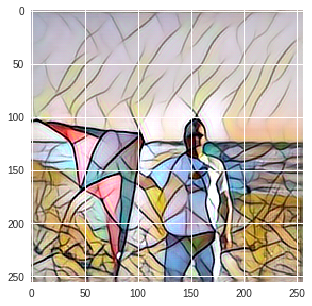

Saved sample tranformed image at /content/sample0_16000.png
========Iteration 16501/20696========
	Content Loss:	6837996.50
	Style Loss:	3545865.50
	Total Loss:	10383859.29
Time elapsed:	11101.42211818695 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_16500.pth


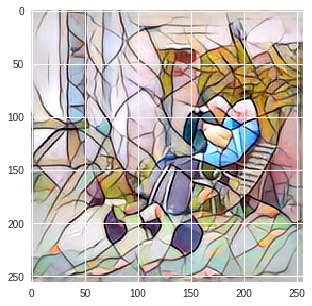

Saved sample tranformed image at /content/sample0_16500.png
========Iteration 17001/20696========
	Content Loss:	6820111.50
	Style Loss:	3481029.75
	Total Loss:	10301134.10
Time elapsed:	11437.666522741318 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17000.pth


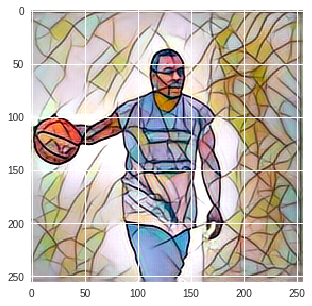

Saved sample tranformed image at /content/sample0_17000.png
========Iteration 17501/20696========
	Content Loss:	6803874.50
	Style Loss:	3420281.50
	Total Loss:	10224148.08
Time elapsed:	11773.929668188095 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_17500.pth


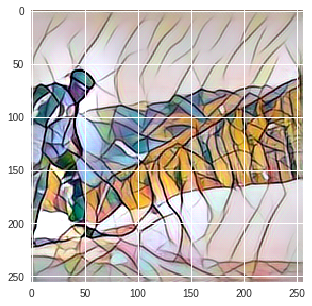

Saved sample tranformed image at /content/sample0_17500.png
========Iteration 18001/20696========
	Content Loss:	6787006.50
	Style Loss:	3362130.00
	Total Loss:	10149126.68
Time elapsed:	12110.160536289215 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18000.pth


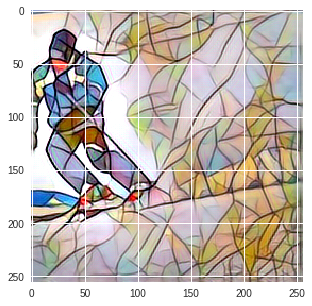

Saved sample tranformed image at /content/sample0_18000.png
========Iteration 18501/20696========
	Content Loss:	6770614.00
	Style Loss:	3307214.75
	Total Loss:	10077816.49
Time elapsed:	12446.392877101898 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_18500.pth


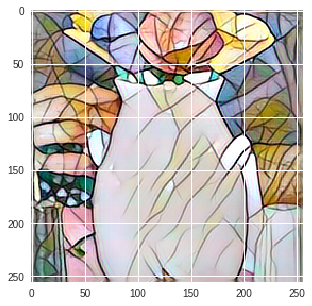

Saved sample tranformed image at /content/sample0_18500.png
========Iteration 19001/20696========
	Content Loss:	6755228.00
	Style Loss:	3254965.00
	Total Loss:	10010181.18
Time elapsed:	12782.593847036362 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19000.pth


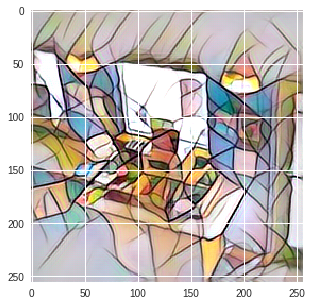

Saved sample tranformed image at /content/sample0_19000.png
========Iteration 19501/20696========
	Content Loss:	6740968.50
	Style Loss:	3205254.00
	Total Loss:	9946212.61
Time elapsed:	13118.908437013626 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_19500.pth


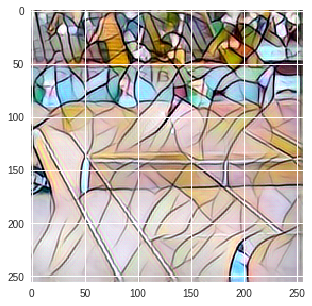

Saved sample tranformed image at /content/sample0_19500.png
========Iteration 20001/20696========
	Content Loss:	6727166.00
	Style Loss:	3157940.00
	Total Loss:	9885094.65
Time elapsed:	13455.37432384491 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20000.pth


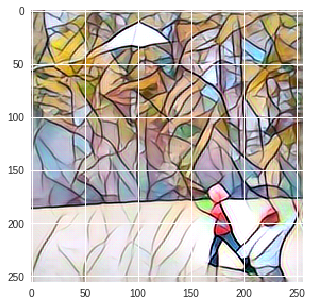

Saved sample tranformed image at /content/sample0_20000.png
========Iteration 20501/20696========
	Content Loss:	6713106.00
	Style Loss:	3112810.00
	Total Loss:	9825916.82
Time elapsed:	13791.919176340103 seconds
Saved TransformerNetwork checkpoint file at /content/checkpoint_20500.pth


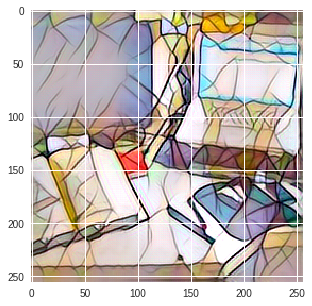

Saved sample tranformed image at /content/sample0_20500.png


RuntimeError: ignored

In [0]:
def train():
    # Seeds
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    np.random.seed(SEED)
    random.seed(SEED)

    # Device
    device = ("cuda" if torch.cuda.is_available() else "cpu")

    # Dataset and Dataloader
    transform = transforms.Compose([
        transforms.Resize(TRAIN_IMAGE_SIZE),
        transforms.CenterCrop(TRAIN_IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Lambda(lambda x: x.mul(255))
    ])
    train_dataset = datasets.ImageFolder(DATASET_PATH, transform=transform)
    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

    # Load networks
    TransformerNetwork = transformer.TransformerNetwork().to(device)
    VGG = vgg.VGG16('/content/vgg16-00b39a1b.pth').to(device)

    # Get Style Features
    imagenet_neg_mean = torch.tensor([-103.939, -116.779, -123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    imagenet_mean = torch.tensor([103.939, 116.779, 123.68], dtype=torch.float32).reshape(1,3,1,1).to(device)
    style_image = utils.load_image(STYLE_IMAGE_PATH)
    style_tensor = utils.itot(style_image).to(device)
    style_tensor = style_tensor.add(imagenet_neg_mean)
    B, C, H, W = style_tensor.shape
    style_features = VGG(style_tensor.expand([BATCH_SIZE, C, H, W]))
    style_gram = {}
    for key, value in style_features.items():
        style_gram[key] = utils.gram(value)

    # Optimizer settings
    optimizer = optim.Adam(TransformerNetwork.parameters(), lr=ADAM_LR)

    # Loss trackers
    content_loss_history = []
    style_loss_history = []
    total_loss_history = []
    batch_content_loss_sum = 0
    batch_style_loss_sum = 0
    batch_total_loss_sum = 0

    # Optimization/Training Loop
    batch_count = 1
    start_time = time.time()
    for epoch in range (1, NUM_EPOCHS+1):
        print("========Epoch {}/{}========".format(epoch, NUM_EPOCHS+1))
        for batch_id, (content_batch, _) in enumerate(train_loader):
            # Zero-out Gradients
            optimizer.zero_grad()

            # Generate images and get features
            content_batch = content_batch[:,[2,1,0]].to(device)
            generated_batch = TransformerNetwork(content_batch)
            content_features = VGG(content_batch.add(imagenet_neg_mean))
            generated_features = VGG(generated_batch.add(imagenet_neg_mean))

            # Content Loss
            MSELoss = nn.MSELoss().to(device)
            content_loss = CONTENT_WEIGHT * MSELoss(content_features['relu2_2'], generated_features['relu2_2'])            
            batch_content_loss_sum += content_loss

            # Style Loss
            style_loss = 0
            for key, value in generated_features.items():
                s_loss = MSELoss(utils.gram(value), style_gram[key])
                style_loss += s_loss
            style_loss *= STYLE_WEIGHT
            batch_style_loss_sum += style_loss

            # Total Loss
            total_loss = content_loss + style_loss
            batch_total_loss_sum += total_loss.item()

            # Backprop and Weight Update
            total_loss.backward()
            optimizer.step()

            # Save Model and Print Losses
            if (((batch_count-1)%SAVE_MODEL_EVERY == 0) or (batch_count==NUM_EPOCHS*len(train_loader))):
                # Print Losses
                print("========Iteration {}/{}========".format(batch_count, NUM_EPOCHS*len(train_loader)))
                print("\tContent Loss:\t{:.2f}".format(batch_content_loss_sum/batch_count))
                print("\tStyle Loss:\t{:.2f}".format(batch_style_loss_sum/batch_count))
                print("\tTotal Loss:\t{:.2f}".format(batch_total_loss_sum/batch_count))
                print("Time elapsed:\t{} seconds".format(time.time()-start_time))

                # Save Model
                checkpoint_path = SAVE_MODEL_PATH + "checkpoint_" + str(batch_count-1) + ".pth"
                torch.save(TransformerNetwork.state_dict(), checkpoint_path)
                print("Saved TransformerNetwork checkpoint file at {}".format(checkpoint_path))

                # Save sample generated image
                sample_tensor = generated_batch[0].clone().detach().unsqueeze(dim=0)
                sample_image = utils.ttoi(sample_tensor.clone().detach())
                sample_image_path = SAVE_IMAGE_PATH + "sample0_" + str(batch_count-1) + ".png"
                utils.saveimg(sample_image, sample_image_path)
                utils.show(sample_image)
                print("Saved sample tranformed image at {}".format(sample_image_path))

                # Save loss histories
                content_loss_history.append(batch_total_loss_sum/batch_count)
                style_loss_history.append(batch_style_loss_sum/batch_count)
                total_loss_history.append(batch_total_loss_sum/batch_count)

            # Iterate Batch Counter
            batch_count+=1

    stop_time = time.time()
    # Print loss histories
    print("Done Training the Transformer Network!")
    print("Training Time: {} seconds".format(stop_time-start_time))
    print("========Content Loss========")
    print(content_loss_history) 
    print("========Style Loss========")
    print(style_loss_history) 
    print("========Total Loss========")
    print(total_loss_history) 

    # Save TransformerNetwork weights
    TransformerNetwork.eval()
    TransformerNetwork.cpu()
    final_path = SAVE_MODEL_PATH + "transformer_weight.pth"
    print("Saving TransformerNetwork weights at {}".format(final_path))
    torch.save(TransformerNetwork.state_dict(), final_path)
    print("Done saving final model")

train()